In [1]:
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip

--2024-01-16 07:48:11--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 64.233.182.207, 64.233.183.207, 173.194.193.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|64.233.182.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149574867 (143M) [application/zip]
Saving to: ‘horse-or-human.zip’

horse-or-human.zip  100%[===================>] 142.65M   145MB/s    in 1.0s    

2024-01-16 07:48:12 (145 MB/s) - ‘horse-or-human.zip’ saved [149574867/149574867]



In [2]:
import zipfile

# Unzip the dataset
local_zip = './horse-or-human.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('./horse-or-human')
zip_ref.close()

In [3]:
import os


train_horse_dir = os.path.join('./horse-or-human/horses')

train_human_dir = os.path.join('./horse-or-human/humans')

In [4]:
train_horse_names = os.listdir(train_horse_dir)
print(train_horse_names[:10])

train_human_names = os.listdir(train_human_dir)
print(train_human_names[:10])

['horse20-2.png', 'horse39-2.png', 'horse34-2.png', 'horse47-3.png', 'horse17-7.png', 'horse43-1.png', 'horse30-4.png', 'horse16-9.png', 'horse35-2.png', 'horse35-6.png']
['human08-25.png', 'human08-01.png', 'human10-04.png', 'human12-05.png', 'human15-04.png', 'human13-20.png', 'human08-21.png', 'human01-03.png', 'human10-10.png', 'human12-27.png']


In [5]:
print('total training horse images:', len(os.listdir(train_horse_dir)))
print('total training human images:', len(os.listdir(train_human_dir)))

total training horse images: 500
total training human images: 527


In [6]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 8
ncols = 8

# Index for iterating over images
pic_index = 0

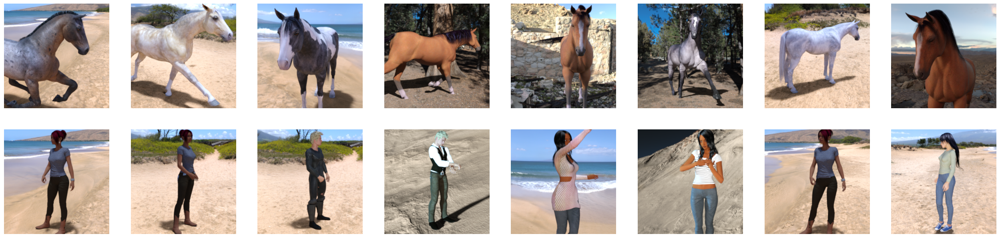

In [7]:
fig = plt.gcf() #getting current fig
fig.set_size_inches(ncols * 4, nrows * 4) #size of img in inch

pic_index += 8
next_horse_pix = [os.path.join(train_horse_dir, fname)
                for fname in train_horse_names[pic_index-8:pic_index]]
next_human_pix = [os.path.join(train_human_dir, fname)
                for fname in train_human_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_horse_pix+next_human_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [8]:
import tensorflow as tf

In [9]:
model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 300x300 with 3 bytes color
    # This is the first convolution
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(300, 300, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fifth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # Flatten the results to feed into a DNN
    tf.keras.layers.Flatten(),
    # 512 neuron hidden layer
    tf.keras.layers.Dense(512, activation='relu'),
    # Only 1 output neuron. It will contain a value from 0-1 where 0 for 1 class ('horses') and 1 for the other ('humans')
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 149, 149, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 147, 147, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 73, 73, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 71, 71, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 35, 35, 64)        0

In [11]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=0.001),
              metrics=['accuracy'])

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 128 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        '/content/horse-or-human',  # This is the source directory for training images
        target_size=(300, 300),  # All images will be resized to 300x300
        batch_size=128,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

Found 1027 images belonging to 2 classes.


In [13]:
history = model.fit(
      train_generator,
      steps_per_epoch=8,
      epochs=15,
      verbose=1)

Epoch 1/15
8/8 [==============================] - 17s 595ms/step - loss: 0.7140 - accuracy: 0.4917
Epoch 2/15
8/8 [==============================] - 6s 773ms/step - loss: 0.6987 - accuracy: 0.6630
Epoch 3/15
8/8 [==============================] - 7s 778ms/step - loss: 0.6514 - accuracy: 0.7152
Epoch 4/15
8/8 [==============================] - 7s 899ms/step - loss: 0.5813 - accuracy: 0.7631
Epoch 5/15
8/8 [==============================] - 7s 930ms/step - loss: 0.4000 - accuracy: 0.8465
Epoch 6/15
8/8 [==============================] - 7s 832ms/step - loss: 0.8301 - accuracy: 0.8387
Epoch 7/15
8/8 [==============================] - 7s 897ms/step - loss: 0.2273 - accuracy: 0.9288
Epoch 8/15
8/8 [==============================] - 7s 782ms/step - loss: 0.5145 - accuracy: 0.8765
Epoch 9/15
8/8 [==============================] - 7s 840ms/step - loss: 0.1658 - accuracy: 0.9522
Epoch 10/15
8/8 [==============================] - 8s 1s/step - loss: 0.2057 - accuracy: 0.9150
Epoch 11/15
8/8 [====

In [14]:
import numpy as np
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  path = '/content/' + fn
  img = load_img(path, target_size=(300, 300))
  x = img_to_array(img)
  x /= 255
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=10)
  print(classes[0])

  if classes[0]>0.5:
    print(fn + " is a human")
  else:
    print(fn + " not a human")

Saving knife_4.jpg to knife_4.jpg
1/1 [==============================] - 0s 430ms/step
[0.23702021]
knife_4.jpg not a human


In [15]:
model.save('my_model.keras')

1/1 [==============================] - 0s 20ms/step


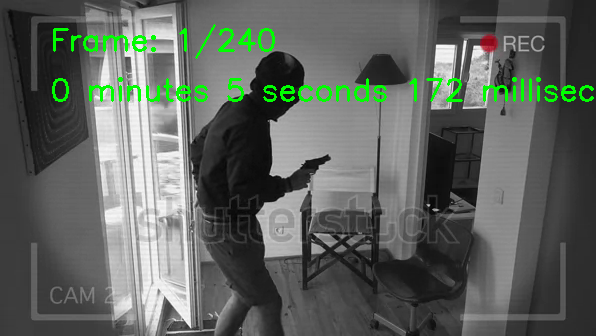

1/1 [==============================] - 0s 18ms/step


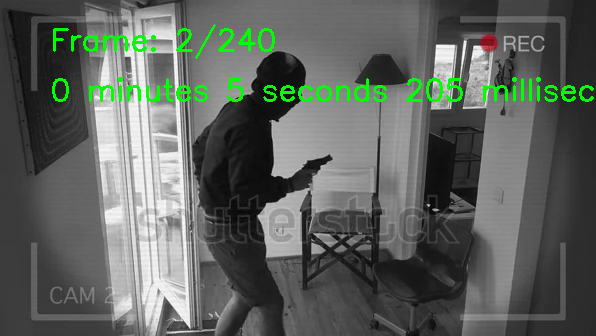

1/1 [==============================] - 0s 23ms/step


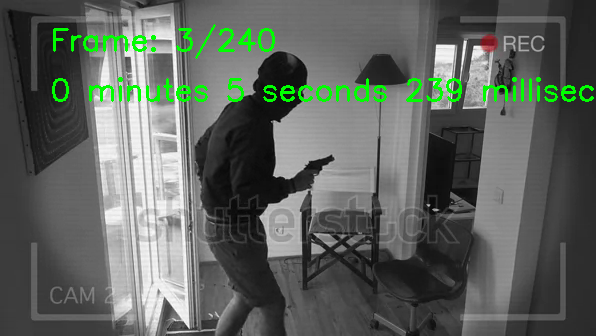

1/1 [==============================] - 0s 19ms/step


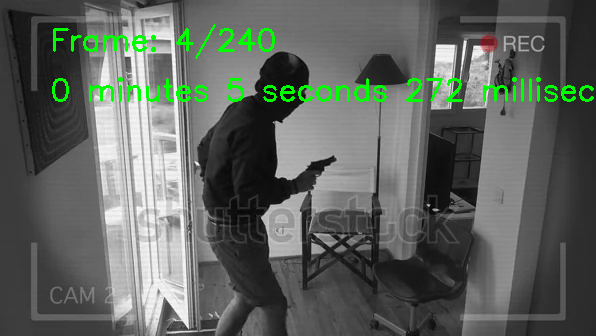

1/1 [==============================] - 0s 18ms/step


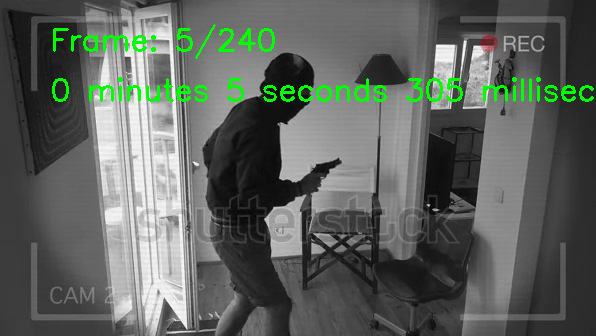

1/1 [==============================] - 0s 18ms/step


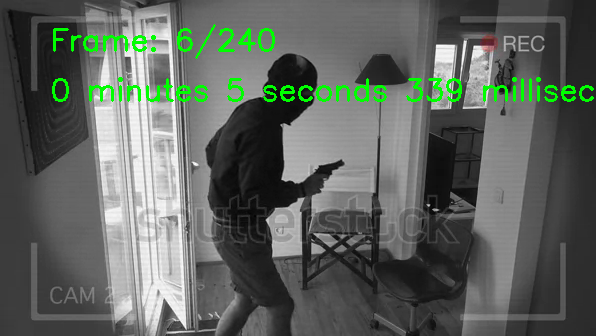

1/1 [==============================] - 0s 19ms/step


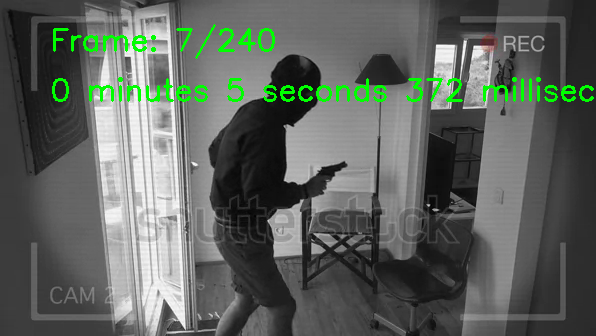

1/1 [==============================] - 0s 18ms/step


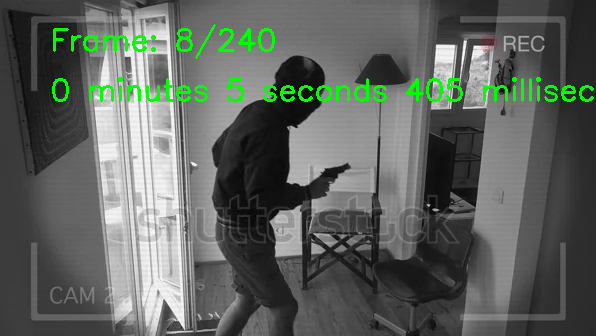

1/1 [==============================] - 0s 28ms/step


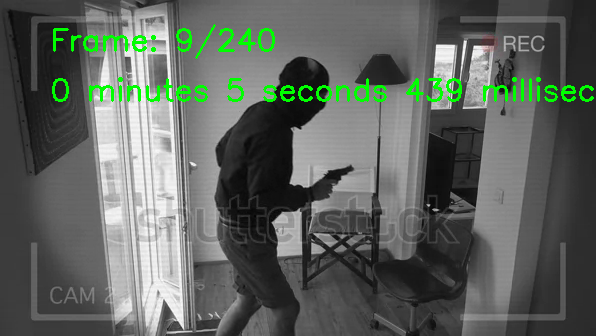

1/1 [==============================] - 0s 28ms/step


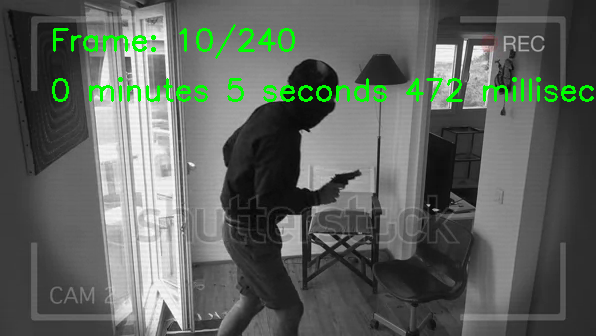

1/1 [==============================] - 0s 36ms/step


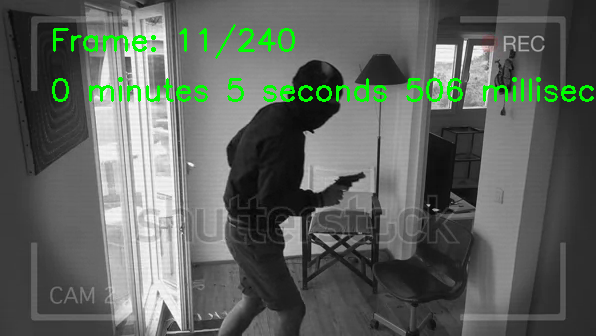

1/1 [==============================] - 0s 37ms/step


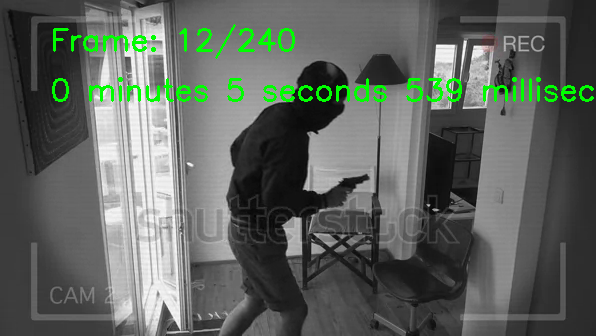

1/1 [==============================] - 0s 27ms/step


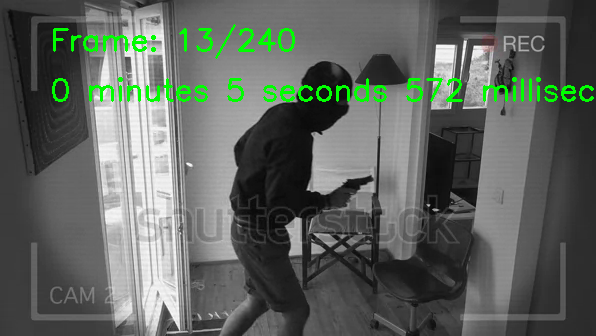

1/1 [==============================] - 0s 27ms/step


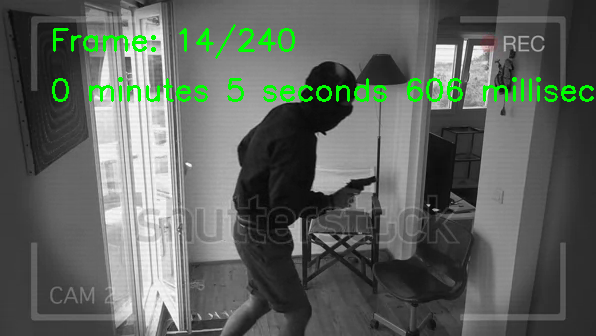

1/1 [==============================] - 0s 26ms/step


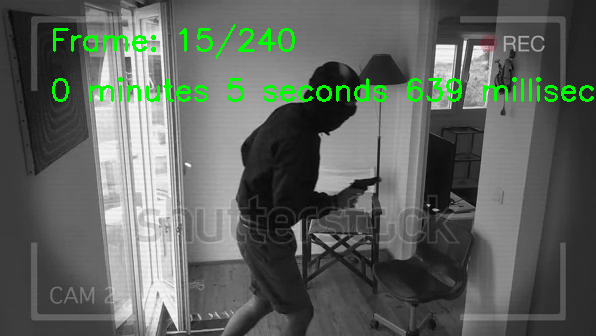

1/1 [==============================] - 0s 34ms/step


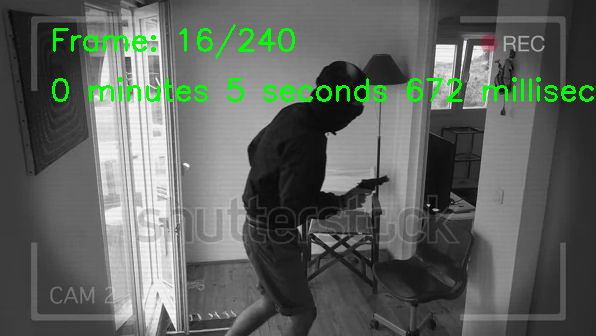

1/1 [==============================] - 0s 34ms/step


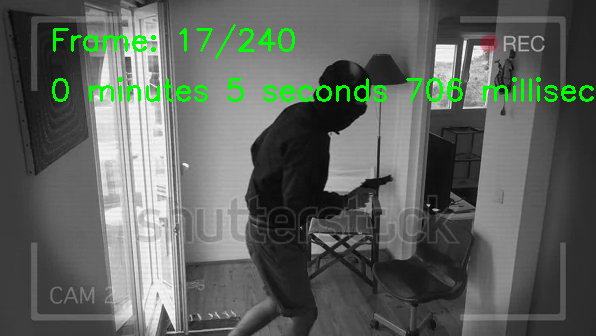

1/1 [==============================] - 0s 54ms/step


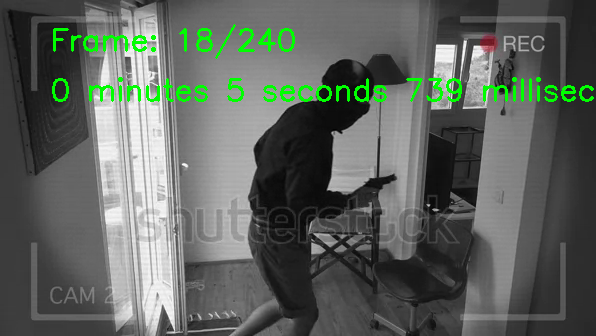

1/1 [==============================] - 0s 42ms/step


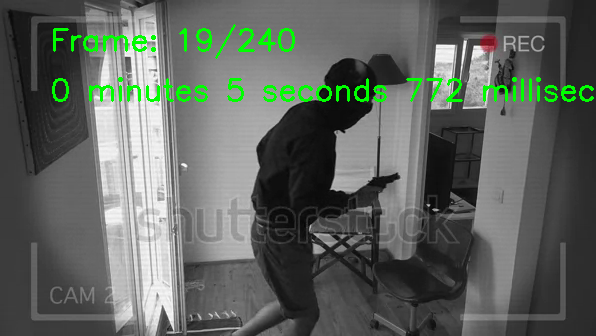

1/1 [==============================] - 0s 48ms/step


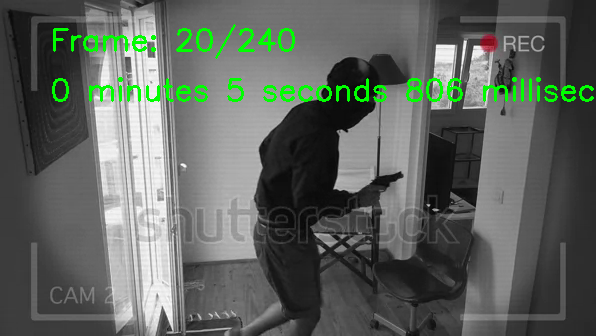

1/1 [==============================] - 0s 35ms/step


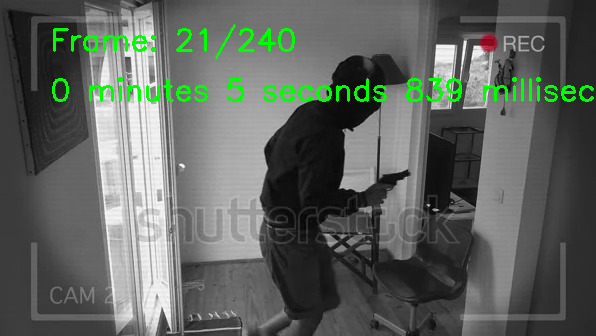

1/1 [==============================] - 0s 39ms/step


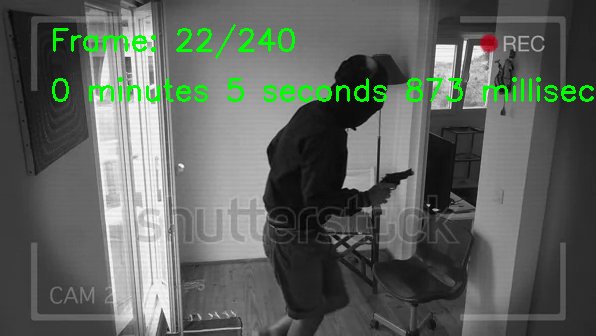

1/1 [==============================] - 0s 31ms/step


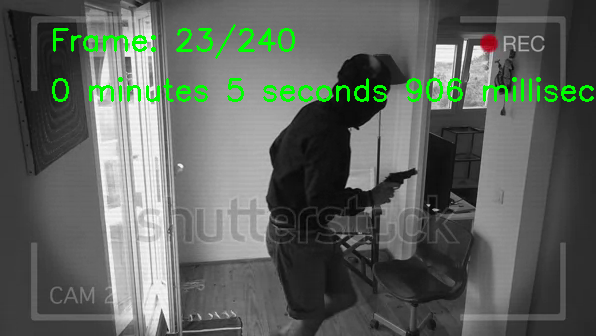

1/1 [==============================] - 0s 48ms/step


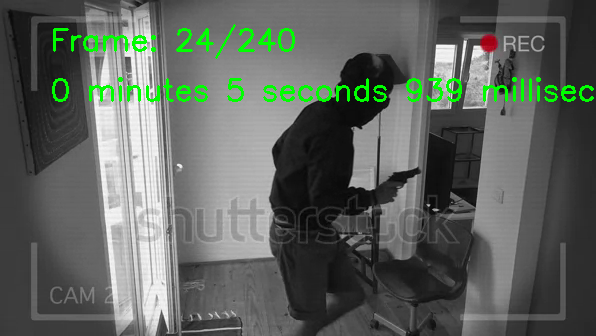

1/1 [==============================] - 0s 36ms/step


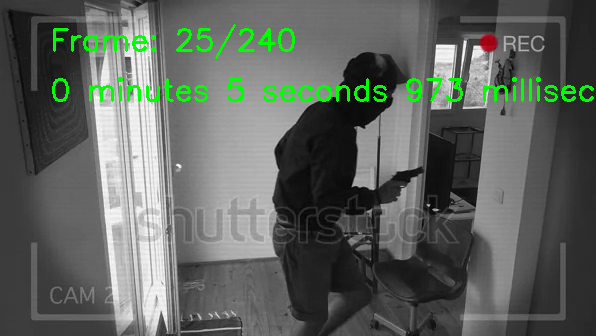

1/1 [==============================] - 0s 52ms/step


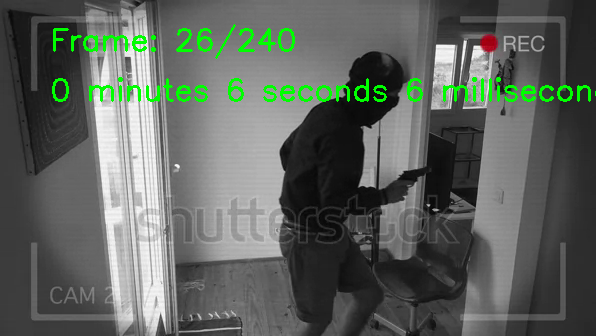

1/1 [==============================] - 0s 26ms/step


In [16]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Load your trained model
model = load_model('/content/my_model.keras')

# Open the video file
video_path = '/content/home_security.webm'
cap = cv2.VideoCapture(video_path)

frame_number = 0  # Initialize frame number
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Preprocess the frame (resize, normalization, etc.)
    resized_frame = cv2.resize(frame, (300, 300))  # Resize the frame as needed
    processed_frame = resized_frame / 255.0  # Normalize pixel values

    # Prepare the frame for prediction (similar to the image preprocessing you used before)
    processed_frame = np.expand_dims(processed_frame, axis=0)  # Add batch dimension

    # Make predictions using the loaded model
    classes = model.predict(processed_frame)

    # Retrieve the timestamp for the current frame in milliseconds
    current_time_ms = cap.get(cv2.CAP_PROP_POS_MSEC)

    # Convert milliseconds to minutes, seconds, and milliseconds
    current_time_sec = current_time_ms / 1000
    minutes = int(current_time_sec // 60)
    seconds = int(current_time_sec % 60)
    milliseconds = int(current_time_ms % 1000)

    # Display the frame and frame number when a human is detected
    if classes[0] > 0.5:
        frame_number += 1  # Increment frame number when human is detected
        cv2.putText(frame, f"Frame: {frame_number}/{total_frames}", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        cv2.putText(frame, f"{minutes} minutes {seconds} seconds {milliseconds} milliseconds", (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        cv2_imshow(frame)

cap.release()

1/1 [==============================] - 0s 19ms/step


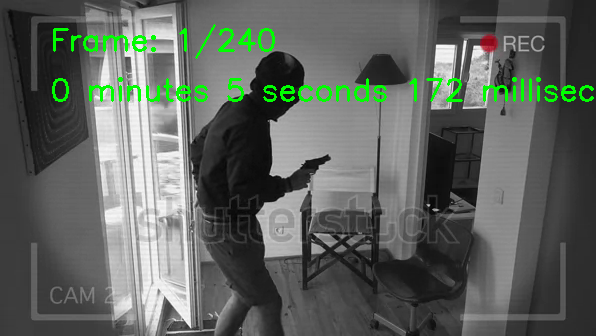

1/1 [==============================] - 0s 18ms/step


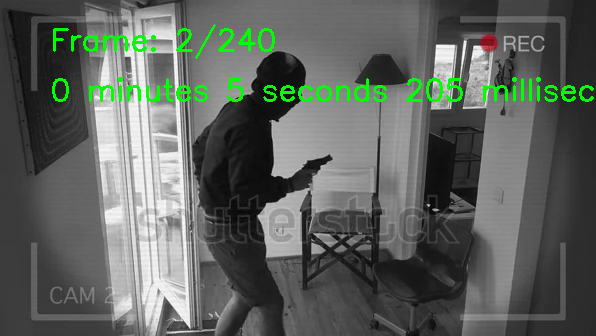

1/1 [==============================] - 0s 18ms/step


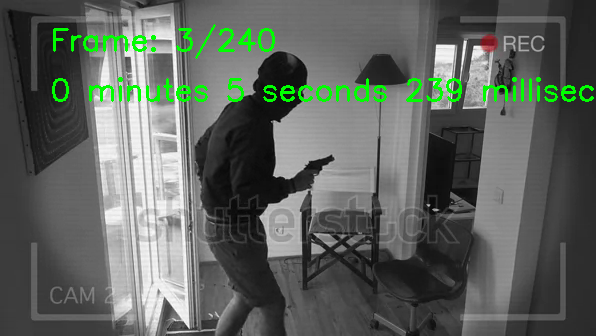

1/1 [==============================] - 0s 18ms/step


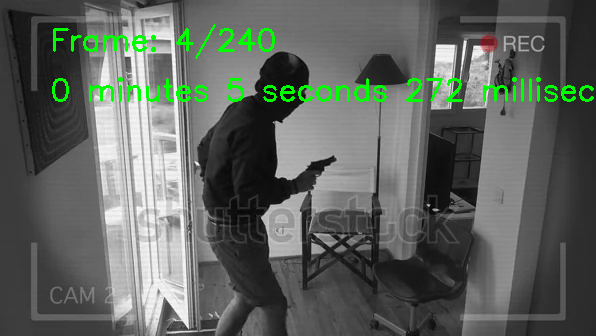

1/1 [==============================] - 0s 24ms/step


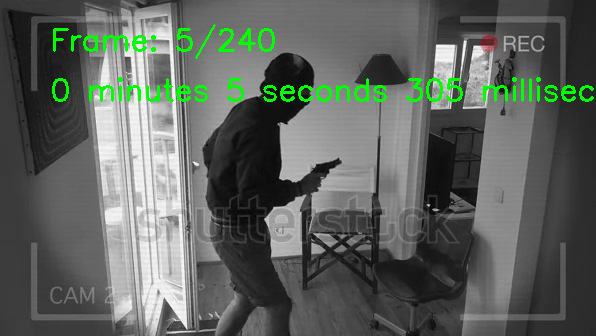

1/1 [==============================] - 0s 20ms/step


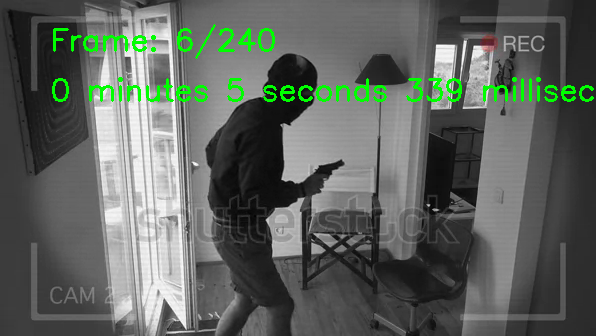

1/1 [==============================] - 0s 20ms/step


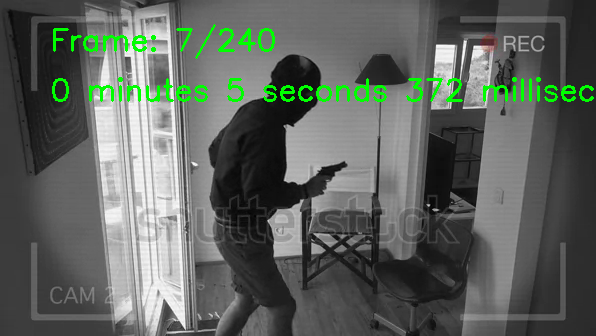

1/1 [==============================] - 0s 18ms/step


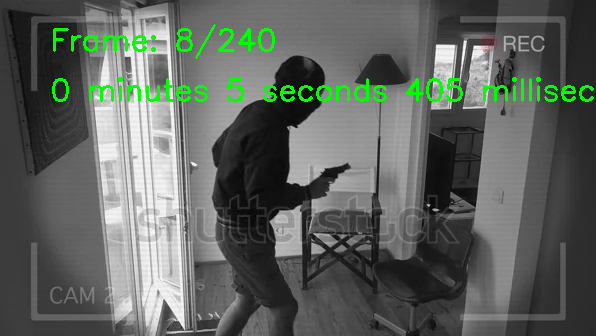

1/1 [==============================] - 0s 18ms/step


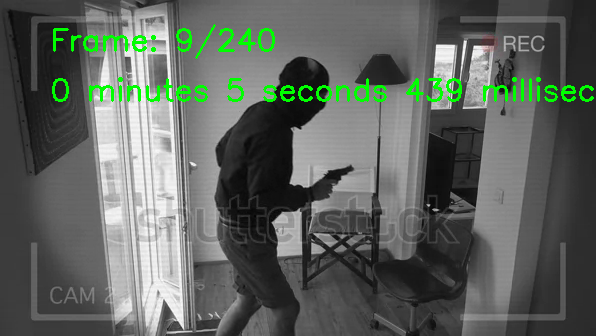

1/1 [==============================] - 0s 18ms/step


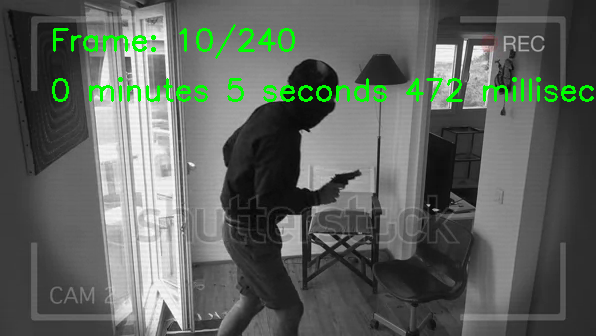

1/1 [==============================] - 0s 20ms/step


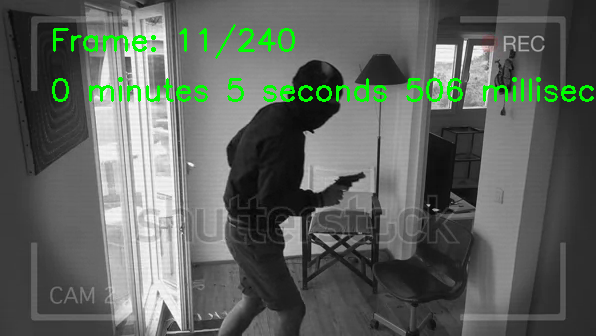

1/1 [==============================] - 0s 17ms/step


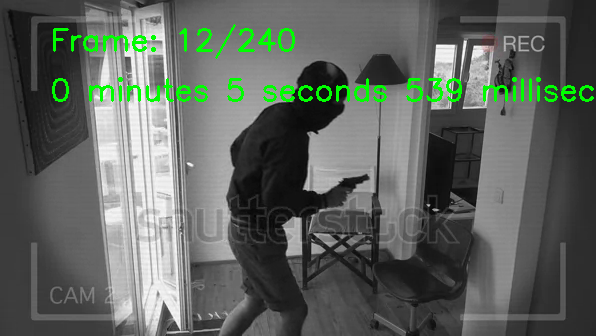

1/1 [==============================] - 0s 19ms/step


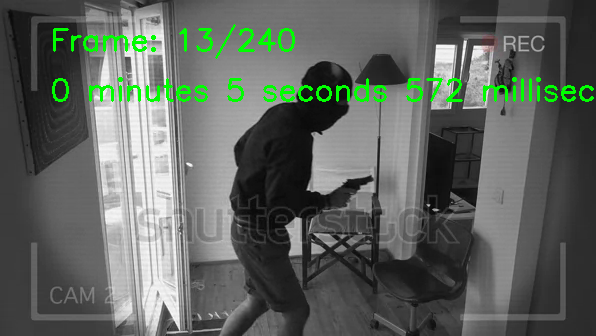

1/1 [==============================] - 0s 24ms/step


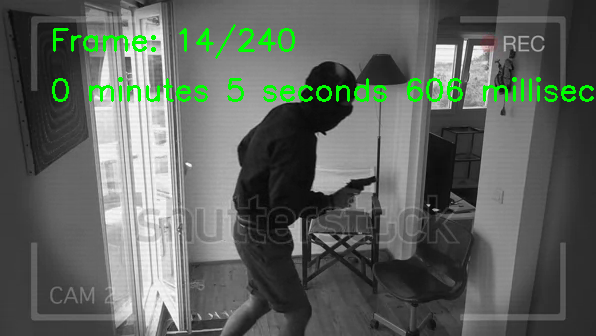

1/1 [==============================] - 0s 24ms/step


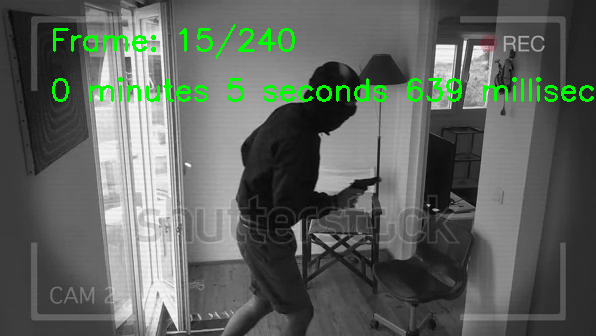

1/1 [==============================] - 0s 19ms/step


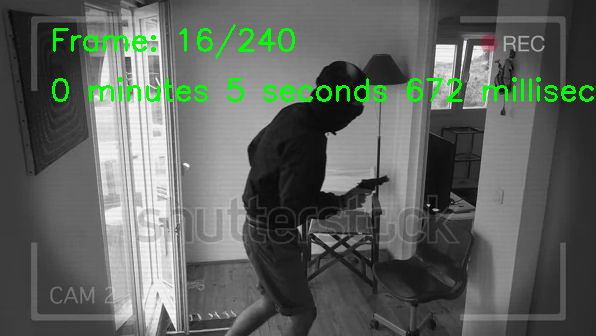

1/1 [==============================] - 0s 40ms/step


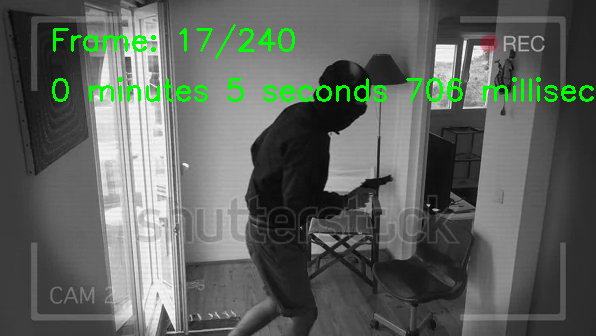

1/1 [==============================] - 0s 25ms/step


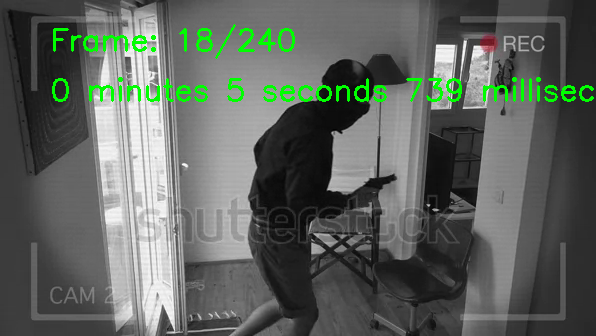

1/1 [==============================] - 0s 25ms/step


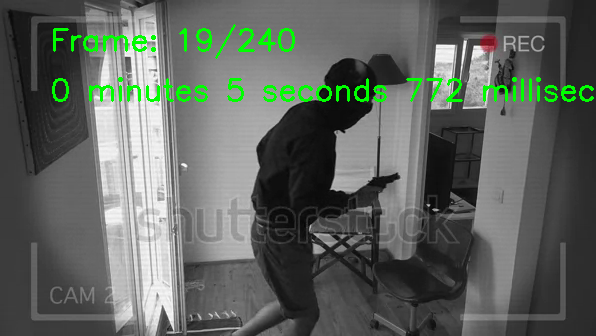

1/1 [==============================] - 0s 25ms/step


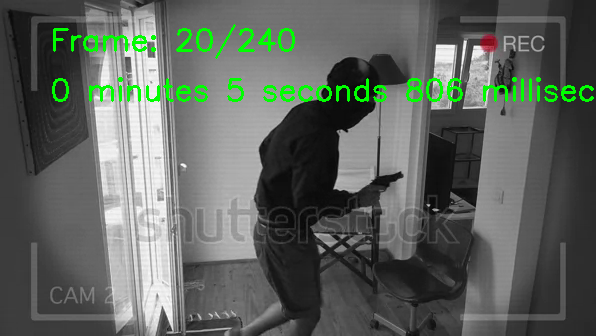

1/1 [==============================] - 0s 26ms/step


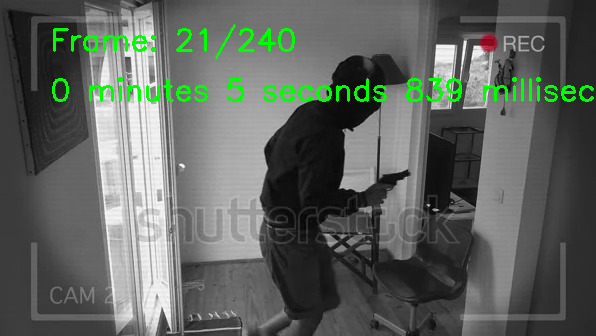

1/1 [==============================] - 0s 26ms/step


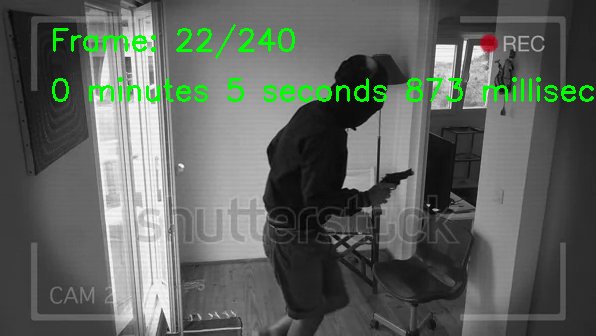

1/1 [==============================] - 0s 28ms/step


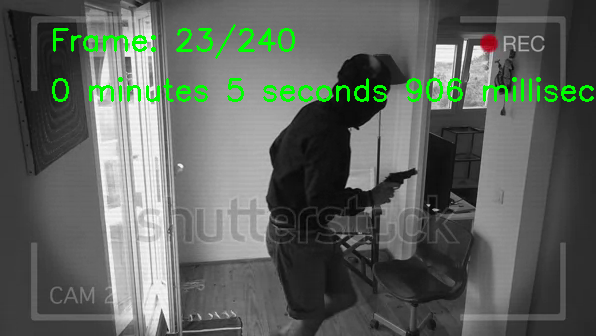

1/1 [==============================] - 0s 28ms/step


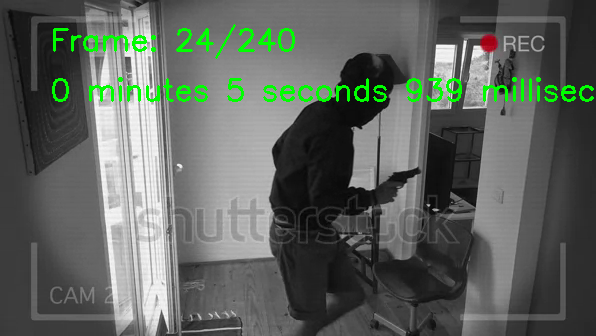

1/1 [==============================] - 0s 27ms/step


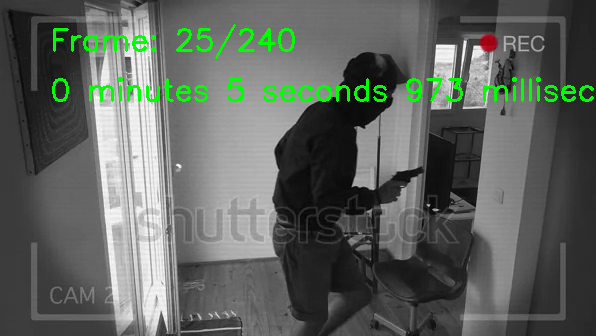

1/1 [==============================] - 0s 29ms/step


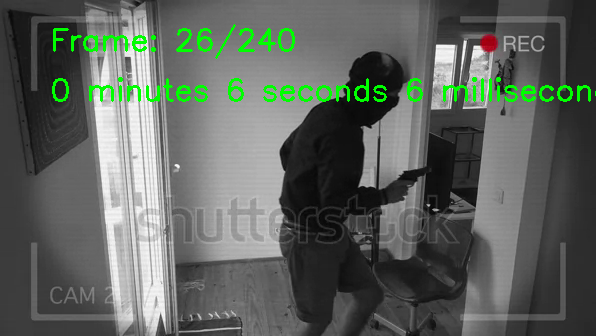

1/1 [==============================] - 0s 38ms/step


In [17]:
import os
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Load your trained model
model = load_model('/content/my_model.keras')

# Open the video file
video_path = '/content/home_security.webm'
cap = cv2.VideoCapture(video_path)

frame_number = 0  # Initialize frame number
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# Create a folder to save the detected frames if it doesn't exist
save_folder = '/content/detected_frames/'
os.makedirs(save_folder, exist_ok=True)

detected_frame_count = 0  # Counter to keep track of detected frames

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Preprocess the frame (resize, normalization, etc.)
    resized_frame = cv2.resize(frame, (300, 300))  # Resize the frame as needed
    processed_frame = resized_frame / 255.0  # Normalize pixel values

    # Prepare the frame for prediction (similar to the image preprocessing you used before)
    processed_frame = np.expand_dims(processed_frame, axis=0)  # Add batch dimension

    # Make predictions using the loaded model
    classes = model.predict(processed_frame)

    # Retrieve the timestamp for the current frame in milliseconds
    current_time_ms = cap.get(cv2.CAP_PROP_POS_MSEC)

    # Convert milliseconds to minutes, seconds, and milliseconds
    current_time_sec = current_time_ms / 1000
    minutes = int(current_time_sec // 60)
    seconds = int(current_time_sec % 60)
    milliseconds = int(current_time_ms % 1000)

    # Display and save the frame when a human is detected
    if classes[0] > 0.5:
        detected_frame_count += 1
        frame_number += 1

        # Display frame info on the frame
        cv2.putText(frame, f"Frame: {frame_number}/{total_frames}", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        cv2.putText(frame, f"{minutes} minutes {seconds} seconds {milliseconds} milliseconds", (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # Show the frame
        cv2_imshow(frame)

        # Save the detected frame
        if detected_frame_count <= 100:  # Save only the first 50 detected frames
            save_path = os.path.join(save_folder, f"detected_frame_{detected_frame_count}.jpg")
            cv2.imwrite(save_path, frame)

cap.release()

In [18]:
from PIL import Image
import os
from IPython.display import Audio, display

def is_image(file_path):
    try:
        img = Image.open(file_path)
        img.verify()
        img.close()
        return True
    except (IOError, SyntaxError):
        return False

# Specify the folder containing the detected frames
folder_path = '/content/detected_frames'

# List all files in the folder
file_list = os.listdir(folder_path)

# Check if any file in the folder is an image
image_detected = False
for file in file_list:
    if is_image(os.path.join(folder_path, file)):
        print(f"Image detected: {file}")
        image_detected = True
        break  # Stop checking once an image is found

# Play song if an image is detected
if image_detected:
    song_path = '/content/sashtiyai_nokka.mp3'  # Replace with your song path
    display(Audio(filename=song_path, autoplay=True))


Image detected: detected_frame_5.jpg


In [19]:
import os

# Path to the folder containing images in Google Drive
folder_path = '/content/detected_frames'

# Get a list of image files in the folder
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp'))]

# Check if there are image files in the folder
if image_files:
    print("Alert.....Someone is there inside the house")
else:
    print("Keep calm....your house things are safe")


Alert.....Someone is there inside the house


In [20]:
!pip install twilio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 9.1 MB/s eta 0:00:00


In [21]:

from twilio.rest import Client

# Your Twilio account SID and authentication token
account_sid = 'AC26d38c1e850dca96bcc632f31128a15f'
auth_token = 'd761134916901f9787e46f75b371a816'

# Twilio phone number and recipient's phone number
twilio_phone = '+18626663430'
recipient_phone = '+918072712153'

# Create a Twilio client
client = Client(account_sid, auth_token)

# Your message content
if image_files:
    message = "Alert: Someone is inside the house!"
else:
    message = "All clear: Your house is safe."

# Send the message
client.messages.create(
    body=message,
    from_=twilio_phone,
    to=recipient_phone
)


<Twilio.Api.V2010.MessageInstance account_sid=AC26d38c1e850dca96bcc632f31128a15f sid=SM17182d2aa59f3058322873e4b220000e>